In [67]:
#import all required libries

##Basic and most important libraies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Classifiers
from sklearn.ensemble import AdaBoostRegressor,GradientBoostingRegressor,RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor

#Data Processing Function

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [68]:
url = ('https://raw.githubusercontent.com/Premalatha-success/Datasets/main/TaxiFare.csv')
df= pd.read_csv(url)

In [69]:
df.head()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
0,26:21.0,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1
1,52:16.0,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1
2,35:00.0,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2
3,30:42.0,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1
4,51:00.0,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1


In [70]:
df.shape

(50000, 8)

In [71]:
df.dtypes

unique_id                object
amount                  float64
date_time_of_pickup      object
longitude_of_pickup     float64
latitude_of_pickup      float64
longitude_of_dropoff    float64
latitude_of_dropoff     float64
no_of_passenger           int64
dtype: object

In [72]:
df.info

<bound method DataFrame.info of       unique_id  amount      date_time_of_pickup  longitude_of_pickup  \
0       26:21.0    4.50  2009-06-15 17:26:21 UTC           -73.844311   
1       52:16.0   16.90  2010-01-05 16:52:16 UTC           -74.016048   
2       35:00.0    5.70  2011-08-18 00:35:00 UTC           -73.982738   
3       30:42.0    7.70  2012-04-21 04:30:42 UTC           -73.987130   
4       51:00.0    5.30  2010-03-09 07:51:00 UTC           -73.968095   
5       50:45.0   12.10  2011-01-06 09:50:45 UTC           -74.000964   
6       35:00.0    7.50  2012-11-20 20:35:00 UTC           -73.980002   
7       22:00.0   16.50  2012-01-04 17:22:00 UTC           -73.951300   
8       10:00.0    9.00  2012-12-03 13:10:00 UTC           -74.006462   
9       11:00.0    8.90  2009-09-02 01:11:00 UTC           -73.980658   
10      30:50.0    5.30  2012-04-08 07:30:50 UTC           -73.996335   
11      24:00.0    5.50  2012-12-24 11:24:00 UTC             0.000000   
12      04:03.0    

In [73]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
amount,50000.0,11.364171,9.685557,-5.000000,6.000000,8.500000,12.500000,200.000000
longitude_of_pickup,50000.0,-72.509756,10.393860,-75.423848,-73.992062,-73.981840,-73.967148,40.783472
latitude_of_pickup,50000.0,39.933759,6.224857,-74.006893,40.734880,40.752678,40.767360,401.083332
longitude_of_dropoff,50000.0,-72.504616,10.407570,-84.654241,-73.991152,-73.980082,-73.963584,40.851027
latitude_of_dropoff,50000.0,39.926251,6.014737,-74.006377,40.734372,40.753372,40.768167,43.415190
no_of_passenger,50000.0,1.667840,1.289195,0.000000,1.000000,1.000000,2.000000,6.000000


In [74]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
unique_id,50000,3597,26:00.0,457,NaN,NaN,NaN,NaN,NaN,NaN,NaN
amount,50000.0,NaN,NaN,NaN,11.364171,9.685557,-5.0,6.0,8.5,12.5,200.0
date_time_of_pickup,50000,49555,2011-09-03 01:30:00 UTC,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
longitude_of_pickup,50000.0,NaN,NaN,NaN,-72.509756,10.39386,-75.423848,-73.992062,-73.98184,-73.967148,40.783472
latitude_of_pickup,50000.0,NaN,NaN,NaN,39.933759,6.224857,-74.006893,40.73488,40.752678,40.76736,401.083332
longitude_of_dropoff,50000.0,NaN,NaN,NaN,-72.504616,10.40757,-84.654241,-73.991152,-73.980082,-73.963584,40.851027
latitude_of_dropoff,50000.0,NaN,NaN,NaN,39.926251,6.014737,-74.006377,40.734372,40.753372,40.768167,43.41519
no_of_passenger,50000.0,NaN,NaN,NaN,1.66784,1.289195,0.0,1.0,1.0,2.0,6.0


In [75]:
df.isnull().sum()

unique_id               0
amount                  0
date_time_of_pickup     0
longitude_of_pickup     0
latitude_of_pickup      0
longitude_of_dropoff    0
latitude_of_dropoff     0
no_of_passenger         0
dtype: int64

In [76]:
df.drop_duplicates(subset='unique_id', keep='first', inplace=True)

In [77]:
df['unique_id'].shape

(3597,)

In [78]:
df.columns

Index(['unique_id', 'amount', 'date_time_of_pickup', 'longitude_of_pickup',
       'latitude_of_pickup', 'longitude_of_dropoff', 'latitude_of_dropoff',
       'no_of_passenger'],
      dtype='object')

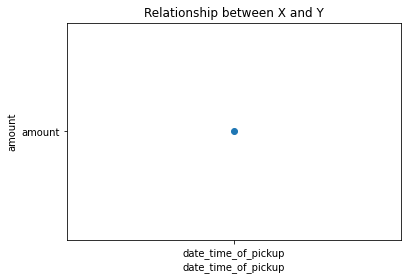

In [79]:
plt.scatter('date_time_of_pickup', 'amount')
plt.xlabel('date_time_of_pickup')
plt.ylabel('amount')
plt.title('Relationship between X and Y')
plt.show()

<AxesSubplot:ylabel='Frequency'>

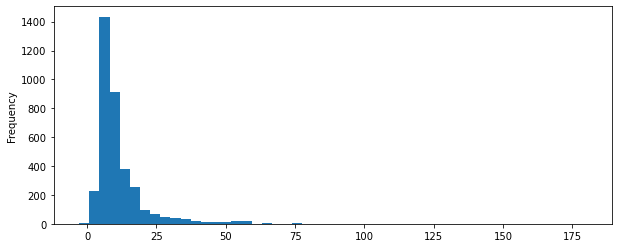

In [80]:
df['amount'].plot.hist(bins=50,figsize=(10,4))

<AxesSubplot:ylabel='Density'>

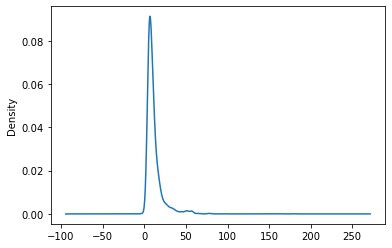

In [81]:
df['amount'].plot.density()

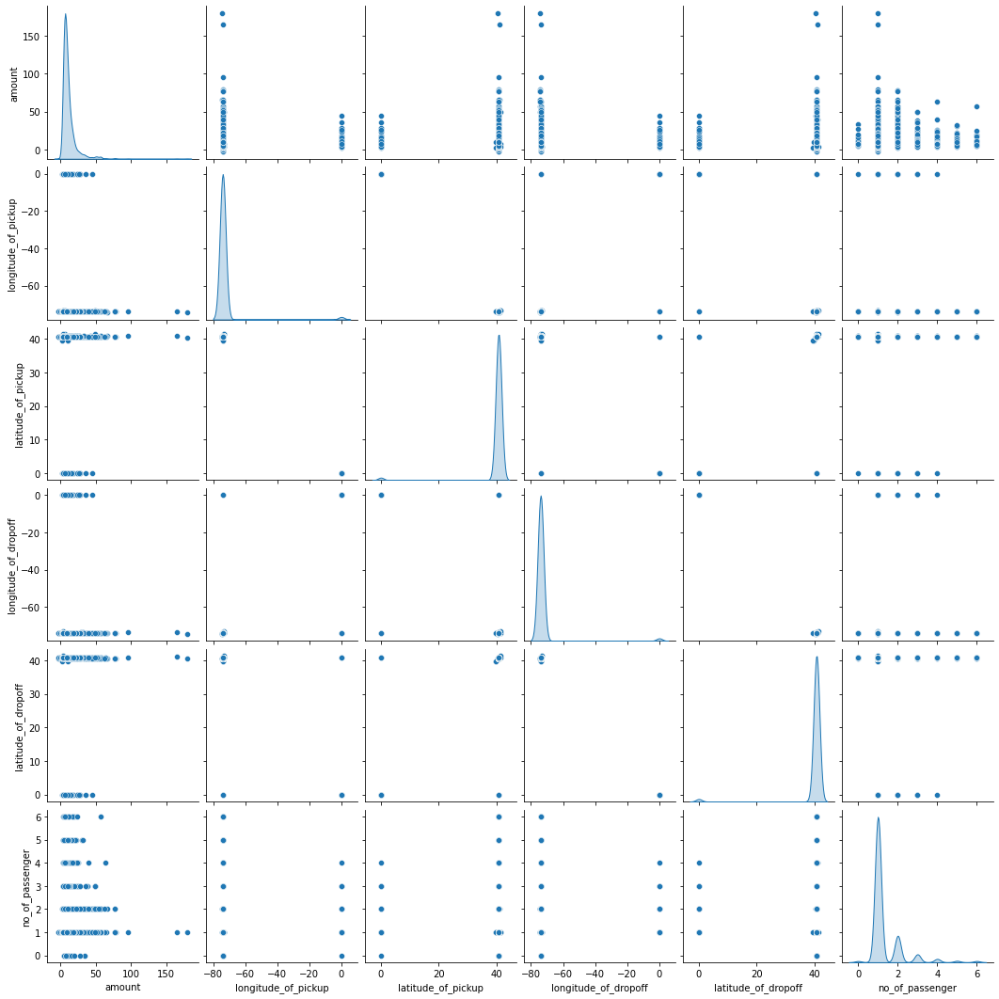

In [82]:
sns.pairplot(df,diag_kind='kde')

In [83]:
corr=df.corr()
corr

,amount,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
amount,1.000000,0.005032,-0.004308,-0.000384,0.000357,0.029914
longitude_of_pickup,0.005032,1.000000,-0.999949,0.966635,-0.966585,-0.023099
latitude_of_pickup,-0.004308,-0.999949,1.000000,-0.966623,0.966631,0.022781
longitude_of_dropoff,-0.000384,0.966635,-0.966623,1.000000,-0.999953,-0.020386
latitude_of_dropoff,0.000357,-0.966585,0.966631,-0.999953,1.000000,0.020372
no_of_passenger,0.029914,-0.023099,0.022781,-0.020386,0.020372,1.000000


<AxesSubplot:>

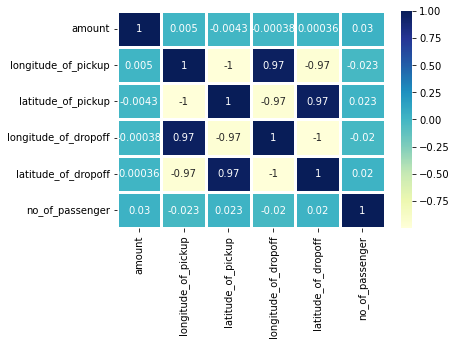

In [84]:
sns.heatmap(corr,annot=True,linewidths=3,cmap='YlGnBu')

<AxesSubplot:xlabel='no_of_passenger', ylabel='amount'>

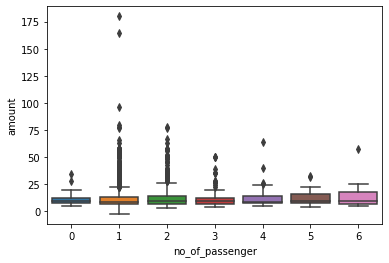

In [85]:
sns.boxplot(x='no_of_passenger',y='amount',data=df)

In [86]:
df['no_of_passenger'].value_counts()

1    2795
2     510
3     153
4      64
5      28
6      24
0      23
Name: no_of_passenger, dtype: int64

In [87]:
median1 = df['no_of_passenger'].median()
median1

1.0

In [88]:
df['no_of_passenger'].replace(0,median1,inplace=True)

In [89]:
df['no_of_passenger'].value_counts()

1    2818
2     510
3     153
4      64
5      28
6      24
Name: no_of_passenger, dtype: int64

In [90]:
df.drop('date_time_of_pickup',axis=1, inplace = True)

In [91]:
df.dtypes

unique_id                object
amount                  float64
longitude_of_pickup     float64
latitude_of_pickup      float64
longitude_of_dropoff    float64
latitude_of_dropoff     float64
no_of_passenger           int64
dtype: object

In [92]:
df.drop('unique_id',axis=1, inplace = True)

In [93]:
df['amount'].value_counts()

 6.50      169
 4.50      142
 8.50      128
 5.30       99
 5.70       98
 7.00       92
 8.00       91
 4.90       91
 6.90       88
 6.10       88
 10.50      87
 8.10       86
 5.00       84
 7.70       82
 6.00       82
 5.50       72
 7.30       71
 4.10       69
 7.50       66
 9.00       65
 12.50      63
 9.50       59
 11.00      54
 9.30       54
 11.50      54
 9.70       53
 8.90       52
 3.70       48
 10.10      47
 10.00      45
 10.90      44
 16.50      40
 11.30      37
 12.00      37
 14.50      35
 4.00       34
 12.90      32
 12.10      31
 11.70      31
 18.50      26
 13.00      26
 13.50      24
 15.50      23
 3.30       23
 16.10      23
 13.70      23
 14.00      22
 17.00      21
 3.50       20
 13.30      20
 16.00      19
 15.00      19
 14.10      18
 2.50       16
 19.00      14
 20.50      14
 57.33      14
 18.00      14
 16.90      13
 15.70      12
 17.50      12
 15.30      11
 21.50      11
 19.50      11
 14.90      11
 52.00      10
 18.10    

In [94]:
df = df[df['amount']>= 0]

In [95]:
df['longitude_of_pickup'].value_counts()

 0.000000     61
-73.990909     3
-73.967178     3
-73.137393     3
-73.988883     3
-73.994279     3
-73.975707     3
-73.990209     2
-73.972978     2
-73.992131     2
-73.976183     2
-73.980209     2
-73.976554     2
-73.885276     2
-73.982269     2
-73.991109     2
-73.984556     2
-73.983783     2
-73.994380     2
-73.873054     2
-73.991983     2
-73.991315     2
-73.982229     2
-74.005771     2
-73.981439     2
-73.870854     2
-73.986524     2
-74.006421     2
-73.998082     2
-73.985717     2
-73.975120     2
-73.977208     2
-73.956240     2
-74.004639     2
-73.976896     2
-73.984900     2
-73.989720     2
-73.974291     2
-73.982412     2
-73.970330     2
-74.006226     2
-73.990112     2
-73.982418     2
-73.988809     2
-74.005470     2
-73.978120     2
-73.993656     2
-73.979952     2
-73.977092     2
-73.990043     2
-73.990482     2
-73.978798     2
-73.995653     2
-74.007455     2
-73.992214     2
-73.980104     2
-73.978894     2
-73.978228     2
-74.005530    

In [96]:
df['latitude_of_pickup'].value_counts()

0.000000     61
41.366138     3
40.754311     2
40.764536     2
40.758641     2
40.768200     2
40.748065     2
40.758476     2
40.736140     2
40.766498     2
40.764702     2
40.761300     2
40.758480     2
40.763005     2
40.739582     2
40.645324     2
40.783716     2
40.748950     2
40.764120     2
40.779197     2
40.765964     2
40.715565     2
40.768364     2
40.750142     2
40.784274     2
40.765440     2
40.753719     2
40.740751     2
40.748285     2
40.742719     2
40.755204     2
40.762394     2
40.772643     2
40.719024     2
40.758877     2
40.718803     2
40.733101     2
40.760058     2
40.732371     2
40.738821     2
40.771313     2
40.769132     2
40.725900     2
40.742165     2
40.748288     2
40.775009     2
40.761807     2
40.752603     2
40.773760     2
40.760160     2
40.738510     2
40.742012     2
40.738625     2
40.761844     2
40.719869     2
40.759881     2
40.740880     2
40.763180     2
40.768633     2
40.753650     2
40.781000     2
40.742155     2
40.73720

In [97]:
df = df[(df['longitude_of_pickup'] != 0.0) & (df['latitude_of_pickup'] != 0.0)]

In [98]:
df.sample

<bound method NDFrame.sample of        amount  longitude_of_pickup  latitude_of_pickup  longitude_of_dropoff  \
0        4.50           -73.844311           40.721319            -73.841610   
1       16.90           -74.016048           40.711303            -73.979268   
2        5.70           -73.982738           40.761270            -73.991242   
3        7.70           -73.987130           40.733143            -73.991567   
4        5.30           -73.968095           40.768008            -73.956655   
5       12.10           -74.000964           40.731630            -73.972892   
7       16.50           -73.951300           40.774138            -73.990095   
8        9.00           -74.006462           40.726713            -73.993078   
9        8.90           -73.980658           40.733873            -73.991540   
10       5.30           -73.996335           40.737142            -73.980721   
12       4.10           -73.991601           40.744712            -73.983081   
13      

In [99]:
print(df.dtypes)

amount                  float64
longitude_of_pickup     float64
latitude_of_pickup      float64
longitude_of_dropoff    float64
latitude_of_dropoff     float64
no_of_passenger           int64
dtype: object


In [100]:
df.sample()

,amount,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
9541,44.5,-73.863562,40.77003,-74.01245,40.716151,1


In [101]:
#df=pd.get_dummies(df,columns=['no_of_passenger'])

# Split the data

In [102]:
y = df['amount']
x= df.drop(['amount'],axis=1)

In [103]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.4,random_state=1)


# Models

## Linear regression

In [104]:
x_train.head()

,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
2684,-73.958603,40.764696,-73.981624,40.736690,1
4975,-73.965411,40.763542,-73.954223,40.770160,1
4110,-73.931122,40.765922,-74.000330,40.735428,1
1841,-73.976683,40.790627,-73.980999,40.744571,1
8179,-74.007011,40.706993,-73.864845,40.768787,1


In [105]:
model1 = LinearRegression()

In [106]:
model1.fit(x_train, y_train)

LinearRegression()

In [107]:
model1.score(x_train, y_train)

0.09750345356570023

In [108]:
model1.score(x_test,y_test)

0.029265506231924587

In [109]:
y.head()

0     4.5
1    16.9
2     5.7
3     7.7
4     5.3
Name: amount, dtype: float64

In [110]:
x.head()

,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
0,-73.844311,40.721319,-73.841610,40.712278,1
1,-74.016048,40.711303,-73.979268,40.782004,1
2,-73.982738,40.761270,-73.991242,40.750562,2
3,-73.987130,40.733143,-73.991567,40.758092,1
4,-73.968095,40.768008,-73.956655,40.783762,1


# Model fit and training

In [131]:
from sklearn import metrics

In [132]:
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression()

# Check the intercept and coefficients and put them in dataframe

In [133]:
print("The intercept of linear model: ", lm.intercept_)

The intercept of linear model:  8045.465135452624


In [134]:
print("The coefficient of the linear model: ", lm.coef_)

The coefficient of the linear model:  [ 81.5385728  -49.28512796  -7.21226274 -12.95354122   0.54697382]


In [135]:
train_pred = lm.predict(x_train)

In [136]:
metrics.mean_squared_error(y_train, train_pred)

102.29296283098297

In [137]:
test_pred = lm.predict(x_test)

In [138]:
metrics.mean_squared_error(y_test, test_pred)

84.07282821784496

In [139]:
metrics.mean_absolute_error(y_test, test_pred)

5.7221165931825215

In [140]:
np.sqrt(metrics.mean_squared_error(y_train, train_pred))

10.113998360242253

# Prediction using lm model

In [141]:
predictions = lm.predict(x_test)
print("Type of predicted object: ", type(predictions))
print("Size of predicted object: ", predictions.shape)

Type of predicted object:  <class 'numpy.ndarray'>
Size of predicted object:  (1414,)


In [142]:
print("Mean absolute error (MAE):", metrics.mean_absolute_error(y_test,predictions))
print("Mean square error (MSE):", metrics.mean_squared_error(y_test,predictions))
print("Root mean square error (RMSE):", np.sqrt(metrics.mean_squared_error(y_test,predictions)))

Mean absolute error (MAE): 5.7221165931825215
Mean square error (MSE): 84.07282821784496
Root mean square error (RMSE): 9.169123634123654


# R-square value

In [143]:
print("R-squared value of predictions:",round(metrics.r2_score(y_test,predictions),3))

R-squared value of predictions: 0.029
